# Notebook 2: Generate Residence Centroids, determine `d1` and visualize centroids and nearest OSMNx nodes

## Introduction to Notebook 2

Our goal within the next three notebooks is to derive the values of three distances from the:
1. `d1` - distance between a Parish residence centroid and the closest OSMNx node
2. `d2` - distance between a testing facility and the closest OSMNx node
3. `d3` - the shortest distance (and route) between the OSMNx nodes (parish residence and testing facility)

<img src="images/d1-d2-d3.jpeg" alt="d1-d2-d3 image" width="700"/>

## Data sources for this notebook

### Data Source: GADM

Download page: https://gadm.org/download_country_v3.html  Use GeoPackage link.

What is GeoPackage? https://www.geopackage.org/

### Download Uganda geopackage

In [1]:
import os

In [2]:
if not os.path.exists('data/gadm36_UGA.gpkg'):
    if not os.path.exists('data/gadm_gpkg.zip'):
        os.system('wget https://biogeo.ucdavis.edu/data/gadm3.6/gpkg/gadm36_UGA_gpkg.zip -O data/gadm_gpkg.zip')
    os.system('unzip data/gadm_gpkg.zip -d data')

### Load Uganda GeoPackage as a GeoPandas GeoDataFrame (GDF)

What is GeoPandas? https://geopandas.org/

What is the difference between Pandas and GeoPandas?

What is GADM? https://gadm.org/

In [3]:
import geopandas as gpd, pandas as pd

pd.options.display.float_format = '{:.10f}'.format

In [4]:
uganda_gdf = gpd.read_file('data/gadm36_UGA.gpkg')

uganda_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 5341 entries, 0 to 5340
Data columns (total 15 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   GID_0      5341 non-null   object  
 1   NAME_0     5341 non-null   object  
 2   GID_1      5341 non-null   object  
 3   NAME_1     5341 non-null   object  
 4   GID_2      5341 non-null   object  
 5   NAME_2     5341 non-null   object  
 6   GID_3      5341 non-null   object  
 7   NAME_3     5341 non-null   object  
 8   GID_4      5341 non-null   object  
 9   NAME_4     5341 non-null   object  
 10  VARNAME_4  0 non-null      object  
 11  TYPE_4     5341 non-null   object  
 12  ENGTYPE_4  5341 non-null   object  
 13  CC_4       0 non-null      object  
 14  geometry   5341 non-null   geometry
dtypes: geometry(1), object(14)
memory usage: 626.0+ KB


<AxesSubplot:>

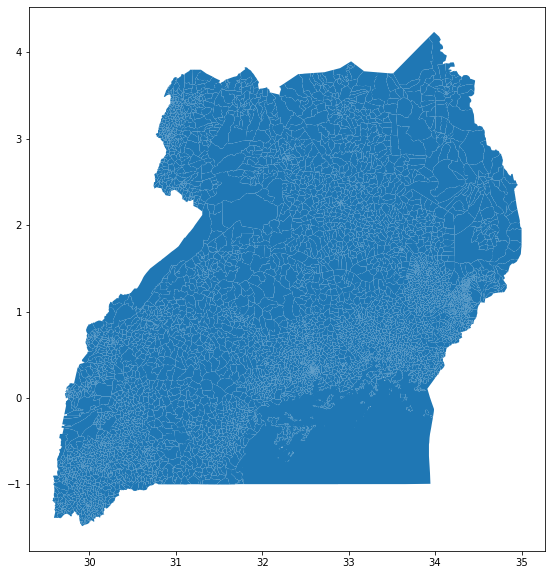

In [5]:
uganda_gdf.plot(figsize=(20, 10))

### Select a parish to study

In [6]:
parishes_gdf = uganda_gdf[uganda_gdf['NAME_1']=='Kampala'].copy()

In [7]:
parishes_gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [8]:
import yaml

with open("proj_crs.yml", "r") as stream:
    try:
        epsg_dict = yaml.safe_load(stream)
    except yaml.YAMLError as exc:
        print(exc)
        
proj_epsg_str = str(epsg_dict).replace("{","").replace("}", "").replace("'","").replace(" ","")

print('Projected graph EPSG code:',proj_epsg_str)

Projected graph EPSG code: EPSG:32636


In [9]:
parishes_gdf['area_sqm'] = parishes_gdf.to_crs(proj_epsg_str)['geometry'].area

In [10]:
parishes_gdf

,GID_0,NAME_0,GID_1,NAME_1,GID_2,NAME_2,GID_3,NAME_3,GID_4,NAME_4,VARNAME_4,TYPE_4,ENGTYPE_4,CC_4,geometry,area_sqm
1391,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.1_1,Central Division,UGA.16.1.1.1_1,Bukesa,None,Parish,Parish,None,"MULTIPOLYGON (((32.56321 0.31958, 32.56292 0.3...",559768.3975113713
1392,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.1_1,Central Division,UGA.16.1.1.2_1,Civic Centre,None,Parish,Parish,None,"MULTIPOLYGON (((32.57724 0.30992, 32.57730 0.3...",1209455.8146584462
1393,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.1_1,Central Division,UGA.16.1.1.3_1,Industrial Area,None,Parish,Parish,None,"MULTIPOLYGON (((32.60664 0.31585, 32.60598 0.3...",1776410.1888784864
1394,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.1_1,Central Division,UGA.16.1.1.4_1,Kagugube,None,Parish,Parish,None,"MULTIPOLYGON (((32.57084 0.32427, 32.57058 0.3...",502708.6719317246
1395,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.1_1,Central Division,UGA.16.1.1.5_1,Kamwokya I,None,Parish,Parish,None,"MULTIPOLYGON (((32.58500 0.34132, 32.58651 0.3...",411428.6768850113
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1482,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.5_1,Rubaga Division,UGA.16.1.5.9_1,Nakulabye,None,Parish,Parish,None,"MULTIPOLYGON (((32.54860 0.33223, 32.55151 0.3...",1026084.8535207562
1483,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.5_1,Rubaga Division,UGA.16.1.5.10_1,Namirembe,None,Parish,Parish,None,"MULTIPOLYGON (((32.56114 0.30923, 32.56108 0.3...",1859599.6021243404
1484,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.5_1,Rubaga Division,UGA.16.1.5.11_1,Nateete,None,Parish,Parish,None,"MULTIPOLYGON (((32.54007 0.30528, 32.53991 0.3...",1804795.3528157366
1485,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.5_1,Rubaga Division,UGA.16.1.5.12_1,Ndeeba,None,Parish,Parish,None,"MULTIPOLYGON (((32.57188 0.29548, 32.57166 0.2...",1962463.6518844874


In [11]:
parishes_polygon = parishes_gdf.geometry.unary_union

parishes_coords = (parishes_polygon.centroid.y, parishes_polygon.centroid.x)

In [12]:
parishes_coords

(0.32245219939201997, 32.59300521351633)

In [13]:
import folium

from folium import plugins

m = folium.Map(location=parishes_coords, zoom_start=14, control_scale=True)

for _, r in parishes_gdf.iterrows():
    # Without simplifying the representation of each borough,
    # the map might not be displayed
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.00001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'color':'black','weight':2, 'fillColor': 'orange','fillOpacity':0.05},
                           highlight_function=lambda x: {'color':'black','weight':2, 'fillColor': 'blue','fillOpacity':0.075})
    folium.Popup('Parish: '+r['NAME_4']+'<br/>'+'Area (sq. m.): '+str(r['area_sqm'])).add_to(geo_j)
    geo_j.add_to(m)
    
m

### Create bounding parish polygon

In this section we will create the bounding parish polygon to enable us to create the data set that includes OSM building footprints for that parish. Downloading all building footprints for all parishes would consume a lot of resources (RAM) - for this initial exploration we will focus on one parish.

How many parishes are there in Kampala?

In [14]:
parish_gdf = parishes_gdf[parishes_gdf['NAME_4']=='Bwaise I'].copy()

In [15]:
parish_polygon = parish_gdf['geometry'].unary_union

In [16]:
type(parish_polygon)

shapely.geometry.polygon.Polygon

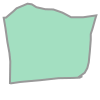

In [17]:
parish_polygon

In [18]:
parish_json = gpd.GeoSeries([parish_polygon]).__geo_interface__

In [19]:
parish_gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

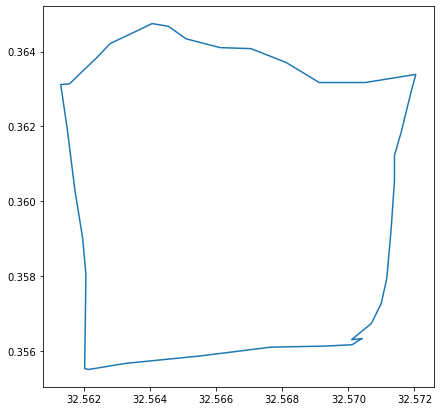

In [20]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (7,7)

x,y = parish_polygon.exterior.xy
plt.plot(x,y)

## Process OSMNx building footprints

### Set up OSMNx and Overpass API

What is OSMNx?

What is the Overpass API?

In [21]:
import osmnx as ox, csv, os

with open('overpass-api.csv', mode='r') as infile:
    reader = csv.reader(infile)
    overpass_api = {rows[0]:rows[1] for rows in reader}

ox.config(
    log_console=True, 
    use_cache=True, 
    log_file=True,
    overpass_endpoint=overpass_api['main']
)

### OSMNx building footprints in GeoPandas GeoDataFrame

Reference: https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.geometries.geometries_from_polygon

In [22]:
# if you changed the target parish above, set use_building_gpkg to False to download new building footprints
use_building_gpkg = False
buildings_gdf = gpd.GeoDataFrame()

if use_building_gpkg:
    if os.path.exists('data/buildings_gdf.gpkg'):
        buildings_gdf = gpd.read_file('data/buildings_gdf.gpkg')

In [23]:
if buildings_gdf.empty:
    buildings_gdf = ox.geometries.geometries_from_polygon(parish_polygon, tags={'building':True})
    # let's save the building footprints so we can reuse this and avoid an OverPass API call
    # we drop the nodes column to avoid the save error due to inability to process node list (we only need geometry)
    #buildings_gdf.drop('nodes', axis=1).to_file('data/buildings_gdf.gpkg', driver='GPKG')

In [24]:
buildings_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
MultiIndex: 5152 entries, ('way', 333290805) to ('relation', 11736110)
Data columns (total 26 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   nodes               5152 non-null   object  
 1   addr:city           1540 non-null   object  
 2   addr:division       1542 non-null   object  
 3   addr:parish         1428 non-null   object  
 4   addr:village        1424 non-null   object  
 5   building            5152 non-null   object  
 6   building:condition  1525 non-null   object  
 7   building:levels     1613 non-null   object  
 8   building:material   1527 non-null   object  
 9   gutter              1524 non-null   object  
 10  roof:downpipe       1526 non-null   object  
 11  roof:material       1510 non-null   object  
 12  source              1269 non-null   object  
 13  geometry            5152 non-null   geometry
 14  name                38 non-null     object  


### Using GeoPandas `explore()` (Folium Map)

Reference: https://geopandas.org/docs/user_guide/interactive_mapping.html

In [25]:
buildings_gdf.explore()

### Select GeoDataFrame columns

In [26]:
filtered_buildings_gdf = buildings_gdf[['building','geometry']].copy()

In [27]:
filtered_buildings_gdf['building'].unique()

array(['commercial', 'multipurpose', 'civic', 'residential', 'yes',
       'roof', 'mosque', 'bathroom', 'apartments', 'toilets', 'school',
       'kitchen', 'warehouse', 'construction', 'hospital', 'goat_shed',
       'industrial', 'poultry house', 'general purpose', 'church', 'tent',
       'hut'], dtype=object)

In [28]:
include_list = ['residential', 'dormitory', 'duplex', 'apartments', 'house']

In [29]:
%%time
residential_gdf = filtered_buildings_gdf[filtered_buildings_gdf['building'].isin(include_list)].copy()

residential_gdf

CPU times: user 11.5 ms, sys: 0 ns, total: 11.5 ms
Wall time: 10.1 ms


building  \
element_type osmid                    
way          333290814  residential   
             333290815  residential   
             381017936  residential   
             381017938  residential   
             381017939  residential   
...                             ...   
             857089618  residential   
             857105938  residential   
             857105950  residential   
             857105951  residential   
             857125311  residential   

                                                                 geometry  
element_type osmid                                                         
way          333290814  POLYGON ((32.56212 0.36023, 32.56208 0.36037, ...  
             333290815  POLYGON ((32.56213 0.36022, 32.56220 0.36023, ...  
             381017936  POLYGON ((32.56126 0.36307, 32.56128 0.36298, ...  
             381017938  POLYGON ((32.56148 0.36297, 32.56151 0.36290, ...  
             381017939  POLYGON ((32.56163 0.36293, 32.56166 0.36285, ...  
...                                                                   ...  
             857089618  POLYGON ((32.56992 0.35736, 32.56990 0.35728, ...  
             857105938  POLYGON ((32.56851 0.35635, 32.56855 0.35641, ...  
             857105950  POLYGON ((32.56860 0.35638, 32.56862 0.35636, ...  
             857105951  POLYGON ((32.56864 0.35639, 32.56869 0.35636, ...  
             857125311  POLYGON ((32.56250 0.35939, 32.56238 0.35935, ...  

[1173 rows x 2 columns]

In [30]:
residential_gdf.explore()

In [31]:
residential_gdf.reset_index(inplace=True)

residential_gdf

,element_type,osmid,building,geometry
0,way,333290814,residential,"POLYGON ((32.56212 0.36023, 32.56208 0.36037, ..."
1,way,333290815,residential,"POLYGON ((32.56213 0.36022, 32.56220 0.36023, ..."
2,way,381017936,residential,"POLYGON ((32.56126 0.36307, 32.56128 0.36298, ..."
3,way,381017938,residential,"POLYGON ((32.56148 0.36297, 32.56151 0.36290, ..."
4,way,381017939,residential,"POLYGON ((32.56163 0.36293, 32.56166 0.36285, ..."
...,...,...,...,...
1168,way,857089618,residential,"POLYGON ((32.56992 0.35736, 32.56990 0.35728, ..."
1169,way,857105938,residential,"POLYGON ((32.56851 0.35635, 32.56855 0.35641, ..."
1170,way,857105950,residential,"POLYGON ((32.56860 0.35638, 32.56862 0.35636, ..."
1171,way,857105951,residential,"POLYGON ((32.56864 0.35639, 32.56869 0.35636, ..."


### Set CRS to EPSG:4326

Why is it important to set a CRS for a GeoDataFrame (GDF)? https://geopandas.org/docs/user_guide/projections.html

In [32]:
residential_gdf.to_crs('EPSG:4326')

,element_type,osmid,building,geometry
0,way,333290814,residential,"POLYGON ((32.56212 0.36023, 32.56208 0.36037, ..."
1,way,333290815,residential,"POLYGON ((32.56213 0.36022, 32.56220 0.36023, ..."
2,way,381017936,residential,"POLYGON ((32.56126 0.36307, 32.56128 0.36298, ..."
3,way,381017938,residential,"POLYGON ((32.56148 0.36297, 32.56151 0.36290, ..."
4,way,381017939,residential,"POLYGON ((32.56163 0.36293, 32.56166 0.36285, ..."
...,...,...,...,...
1168,way,857089618,residential,"POLYGON ((32.56992 0.35736, 32.56990 0.35728, ..."
1169,way,857105938,residential,"POLYGON ((32.56851 0.35635, 32.56855 0.35641, ..."
1170,way,857105950,residential,"POLYGON ((32.56860 0.35638, 32.56862 0.35636, ..."
1171,way,857105951,residential,"POLYGON ((32.56864 0.35639, 32.56869 0.35636, ..."


### Obtain Residence Centroids

What is a centroid? 

In [33]:
residential_centroids_gdf = residential_gdf.copy()

In [34]:
residential_centroids_gdf['geometry'] = residential_centroids_gdf['geometry'].centroid

residential_centroids_gdf

/tmp/ipykernel_2570/1830439308.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  residential_centroids_gdf['geometry'] = residential_centroids_gdf['geometry'].centroid


,element_type,osmid,building,geometry
0,way,333290814,residential,POINT (32.56218 0.36034)
1,way,333290815,residential,POINT (32.56223 0.36000)
2,way,381017936,residential,POINT (32.56131 0.36303)
3,way,381017938,residential,POINT (32.56156 0.36292)
4,way,381017939,residential,POINT (32.56168 0.36290)
...,...,...,...,...
1168,way,857089618,residential,POINT (32.56987 0.35732)
1169,way,857105938,residential,POINT (32.56855 0.35637)
1170,way,857105950,residential,POINT (32.56859 0.35634)
1171,way,857105951,residential,POINT (32.56864 0.35633)


In [35]:
residential_centroids_gdf['lat'] = residential_centroids_gdf.centroid.y
residential_centroids_gdf['lon'] = residential_centroids_gdf.centroid.x

residential_centroids_gdf

/tmp/ipykernel_2570/3520687935.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  residential_centroids_gdf['lat'] = residential_centroids_gdf.centroid.y
/tmp/ipykernel_2570/3520687935.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  residential_centroids_gdf['lon'] = residential_centroids_gdf.centroid.x


,element_type,osmid,building,geometry,lat,lon
0,way,333290814,residential,POINT (32.56218 0.36034),0.3603368779,32.5621807247
1,way,333290815,residential,POINT (32.56223 0.36000),0.3599992134,32.5622259796
2,way,381017936,residential,POINT (32.56131 0.36303),0.3630316500,32.5613123000
3,way,381017938,residential,POINT (32.56156 0.36292),0.3629182447,32.5615562465
4,way,381017939,residential,POINT (32.56168 0.36290),0.3629027217,32.5616812787
...,...,...,...,...,...,...
1168,way,857089618,residential,POINT (32.56987 0.35732),0.3573198547,32.5698698584
1169,way,857105938,residential,POINT (32.56855 0.35637),0.3563654051,32.5685469337
1170,way,857105950,residential,POINT (32.56859 0.35634),0.3563378638,32.5685877369
1171,way,857105951,residential,POINT (32.56864 0.35633),0.3563303332,32.5686410997


In [36]:
residential_centroids_gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

## Create analysis columns

### Create projected lat/lon columns

In [37]:
import yaml

with open("proj_crs.yml", "r") as stream:
    try:
        epsg_dict = yaml.safe_load(stream)
    except yaml.YAMLError as exc:
        print(exc)
        
proj_epsg_str = str(epsg_dict).replace("{","").replace("}", "").replace("'","").replace(" ","")

print('Projected graph EPSG code:',proj_epsg_str)

Projected graph EPSG code: EPSG:32636


Reference for 32636: https://epsg.io/32636

In [38]:
residential_centroids_proj_gdf = residential_centroids_gdf.to_crs(proj_epsg_str)

residential_centroids_proj_gdf.crs

<Projected CRS: EPSG:32636>
Name: WGS 84 / UTM zone 36N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 30°E and 36°E, northern hemisphere between equator and 84°N, onshore and offshore. Belarus. Cyprus. Egypt. Ethiopia. Finland. Israel. Jordan. Kenya. Lebanon. Moldova. Norway. Russian Federation. Saudi Arabia. Sudan. Syria. Turkey. Uganda. Ukraine.
- bounds: (30.0, 0.0, 36.0, 84.0)
Coordinate Operation:
- name: UTM zone 36N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [39]:
residential_centroids_proj_gdf

,element_type,osmid,building,geometry,lat,lon
0,way,333290814,residential,POINT (451282.156 39829.228),0.3603368779,32.5621807247
1,way,333290815,residential,POINT (451287.190 39791.904),0.3599992134,32.5622259796
2,way,381017936,residential,POINT (451185.536 40127.094),0.3630316500,32.5613123000
3,way,381017938,residential,POINT (451212.680 40114.558),0.3629182447,32.5615562465
4,way,381017939,residential,POINT (451226.593 40112.842),0.3629027217,32.5616812787
...,...,...,...,...,...,...
1168,way,857089618,residential,POINT (452137.756 39495.706),0.3573198547,32.5698698584
1169,way,857105938,residential,POINT (451990.542 39390.214),0.3563654051,32.5685469337
1170,way,857105950,residential,POINT (451995.082 39387.170),0.3563378638,32.5685877369
1171,way,857105951,residential,POINT (452001.020 39386.337),0.3563303332,32.5686410997


In [40]:
residential_centroids_proj_gdf['prj_lat'] = residential_centroids_proj_gdf.geometry.y
residential_centroids_proj_gdf['prj_lon'] = residential_centroids_proj_gdf.geometry.x

In [41]:
residential_centroids_proj_gdf

,element_type,osmid,building,geometry,lat,lon,prj_lat,prj_lon
0,way,333290814,residential,POINT (451282.156 39829.228),0.3603368779,32.5621807247,39829.2276353088,451282.1560800679
1,way,333290815,residential,POINT (451287.190 39791.904),0.3599992134,32.5622259796,39791.9042055378,451287.1900764226
2,way,381017936,residential,POINT (451185.536 40127.094),0.3630316500,32.5613123000,40127.0944746504,451185.5356012272
3,way,381017938,residential,POINT (451212.680 40114.558),0.3629182447,32.5615562465,40114.5580946042,451212.6803937041
4,way,381017939,residential,POINT (451226.593 40112.842),0.3629027217,32.5616812787,40112.8416083324,451226.5933957967
...,...,...,...,...,...,...,...,...
1168,way,857089618,residential,POINT (452137.756 39495.706),0.3573198547,32.5698698584,39495.7055670282,452137.7563696548
1169,way,857105938,residential,POINT (451990.542 39390.214),0.3563654051,32.5685469337,39390.2140600737,451990.5416725101
1170,way,857105950,residential,POINT (451995.082 39387.170),0.3563378638,32.5685877369,39387.1696253094,451995.0819472842
1171,way,857105951,residential,POINT (452001.020 39386.337),0.3563303332,32.5686410997,39386.3369594762,452001.0199140694


In [42]:
residential_centroids_4326_gdf = residential_centroids_proj_gdf.to_crs('EPSG:4326')

residential_centroids_4326_gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [43]:
residential_centroids_4326_gdf

,element_type,osmid,building,geometry,lat,lon,prj_lat,prj_lon
0,way,333290814,residential,POINT (32.56218 0.36034),0.3603368779,32.5621807247,39829.2276353088,451282.1560800679
1,way,333290815,residential,POINT (32.56223 0.36000),0.3599992134,32.5622259796,39791.9042055378,451287.1900764226
2,way,381017936,residential,POINT (32.56131 0.36303),0.3630316500,32.5613123000,40127.0944746504,451185.5356012272
3,way,381017938,residential,POINT (32.56156 0.36292),0.3629182447,32.5615562465,40114.5580946042,451212.6803937041
4,way,381017939,residential,POINT (32.56168 0.36290),0.3629027217,32.5616812787,40112.8416083324,451226.5933957967
...,...,...,...,...,...,...,...,...
1168,way,857089618,residential,POINT (32.56987 0.35732),0.3573198547,32.5698698584,39495.7055670282,452137.7563696548
1169,way,857105938,residential,POINT (32.56855 0.35637),0.3563654051,32.5685469337,39390.2140600737,451990.5416725101
1170,way,857105950,residential,POINT (32.56859 0.35634),0.3563378638,32.5685877369,39387.1696253094,451995.0819472842
1171,way,857105951,residential,POINT (32.56864 0.35633),0.3563303332,32.5686410997,39386.3369594762,452001.0199140694


In [44]:
%%time
G_proj = ox.load_graphml('data/g_projected.graphml')

CPU times: user 20.7 s, sys: 725 ms, total: 21.5 s
Wall time: 21.5 s


### Compute d1 and euclidean distance between origin point for residence centroid and OSMNx node

References:
1. OSMNx Distance - Nearest Nodes: https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.distance.nearest_nodes
2. OSMNx Distance - Vectorized Euclidean Distance: https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.distance.euclidean_dist_vec
2. tqdm: https://github.com/tqdm/tqdm

In [45]:
%%time

from tqdm import tqdm, notebook

residential_centroids_4326_gdf['r_node'] = 0
residential_centroids_4326_gdf['r_node_lat'] = 0.0
residential_centroids_4326_gdf['r_node_lon'] = 0.0
residential_centroids_4326_gdf['r_node_y'] = 0.0
residential_centroids_4326_gdf['r_node_x'] = 0.0
residential_centroids_4326_gdf['d1'] = 0.0
residential_centroids_4326_gdf['d1_euc'] = 0.0

# tqdm parameters
total_rows=residential_centroids_4326_gdf.shape[0]

for index, r_row in tqdm(residential_centroids_4326_gdf.iterrows(), total=total_rows):
    r_node, d1 = ox.distance.nearest_nodes(G_proj, r_row['prj_lon'], r_row['prj_lat'], return_dist=True)
    r_node_y = G_proj.nodes[r_node]['y']
    r_node_x = G_proj.nodes[r_node]['x']
    r_node_lat = G_proj.nodes[r_node]['lat']
    r_node_lon = G_proj.nodes[r_node]['lon']
    d1_euc = ox.distance.euclidean_dist_vec(r_row['prj_lat'], r_row['prj_lon'], r_node_y, r_node_x)
    residential_centroids_4326_gdf.loc[index, 'r_node'] = r_node
    residential_centroids_4326_gdf.loc[index, 'r_node_lat'] = r_node_lat
    residential_centroids_4326_gdf.loc[index, 'r_node_lon'] = r_node_lon
    residential_centroids_4326_gdf.loc[index, 'r_node_y'] = r_node_y
    residential_centroids_4326_gdf.loc[index, 'r_node_x'] = r_node_x
    residential_centroids_4326_gdf.loc[index, 'd1'] = d1
    residential_centroids_4326_gdf.loc[index, 'd1_euc'] = d1_euc

    r_dict = {'r_lat':r_row['lat'], 'r_lon':r_row['lon'], 'r_node':r_node, \
              'r_node_lat':r_node_lat, 'r_node_lon':r_node_lon, \
              'r_node_y':r_node_y, 'r_node_x':r_node_x, 'd1':d1, 'd1_euc': d1_euc}
    
    #print(r_dict)

 10%|█         | 121/1173 [01:26<13:42,  1.28it/s]

2021-10-20 12:37:20 Configured OSMnx 1.1.1
2021-10-20 12:37:20 HTTP response caching is on
2021-10-20 12:37:20 Projected GeoDataFrame to +proj=utm +zone=36 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs
2021-10-20 12:37:20 Projected GeoDataFrame to epsg:4326
2021-10-20 12:37:20 Requesting data within polygon from API in 1 request(s)
2021-10-20 12:37:21 Retrieved response from cache file "cache/37e1c25767879f4c9a0d12e3d6f95385b5b829ab.json"
2021-10-20 12:37:21 Got all geometries data within polygon from API in 1 request(s)
2021-10-20 12:37:21 Converting 31434 elements in JSON responses to geometries
2021-10-20 12:37:21 5157 geometries created in the dict
2021-10-20 12:37:21 3 untagged geometries removed
2021-10-20 12:37:21 Created r-tree spatial index for 5154 geometries
2021-10-20 12:37:21 Identified 5153 geometries inside polygon
2021-10-20 12:37:21 1 geometries removed by the polygon filter
2021-10-20 12:37:21 1 geometries removed by the tag filter
2021-10-20 12:37:21 5152 geo

 22%|██▏       | 262/1173 [03:10<10:58,  1.38it/s]

2021-10-20 12:39:14 Created nodes GeoDataFrame from graph
2021-10-20 12:39:15 Created nodes GeoDataFrame from graph
2021-10-20 12:39:16 Created nodes GeoDataFrame from graph
2021-10-20 12:39:17 Created nodes GeoDataFrame from graph
2021-10-20 12:39:18 Created nodes GeoDataFrame from graph
2021-10-20 12:39:18 Created nodes GeoDataFrame from graph
2021-10-20 12:39:19 Created nodes GeoDataFrame from graph
2021-10-20 12:39:20 Created nodes GeoDataFrame from graph
2021-10-20 12:39:20 Created nodes GeoDataFrame from graph
2021-10-20 12:39:21 Created nodes GeoDataFrame from graph
2021-10-20 12:39:22 Created nodes GeoDataFrame from graph
2021-10-20 12:39:23 Created nodes GeoDataFrame from graph
2021-10-20 12:39:23 Created nodes GeoDataFrame from graph
2021-10-20 12:39:24 Created nodes GeoDataFrame from graph
2021-10-20 12:39:25 Created nodes GeoDataFrame from graph
2021-10-20 12:39:26 Created nodes GeoDataFrame from graph
2021-10-20 12:39:26 Created nodes GeoDataFrame from graph
2021-10-20 12:

 34%|███▍      | 403/1173 [04:52<09:12,  1.39it/s]

2021-10-20 12:40:58 Created nodes GeoDataFrame from graph
2021-10-20 12:40:59 Created nodes GeoDataFrame from graph
2021-10-20 12:40:59 Created nodes GeoDataFrame from graph
2021-10-20 12:41:00 Created nodes GeoDataFrame from graph
2021-10-20 12:41:01 Created nodes GeoDataFrame from graph
2021-10-20 12:41:01 Created nodes GeoDataFrame from graph
2021-10-20 12:41:02 Created nodes GeoDataFrame from graph
2021-10-20 12:41:03 Created nodes GeoDataFrame from graph
2021-10-20 12:41:04 Created nodes GeoDataFrame from graph
2021-10-20 12:41:05 Created nodes GeoDataFrame from graph
2021-10-20 12:41:05 Created nodes GeoDataFrame from graph
2021-10-20 12:41:06 Created nodes GeoDataFrame from graph
2021-10-20 12:41:07 Created nodes GeoDataFrame from graph
2021-10-20 12:41:07 Created nodes GeoDataFrame from graph
2021-10-20 12:41:08 Created nodes GeoDataFrame from graph
2021-10-20 12:41:09 Created nodes GeoDataFrame from graph
2021-10-20 12:41:10 Created nodes GeoDataFrame from graph
2021-10-20 12:

 46%|████▋     | 544/1173 [06:34<07:15,  1.44it/s]

2021-10-20 12:42:40 Created nodes GeoDataFrame from graph
2021-10-20 12:42:41 Created nodes GeoDataFrame from graph
2021-10-20 12:42:42 Created nodes GeoDataFrame from graph
2021-10-20 12:42:43 Created nodes GeoDataFrame from graph
2021-10-20 12:42:43 Created nodes GeoDataFrame from graph
2021-10-20 12:42:44 Created nodes GeoDataFrame from graph
2021-10-20 12:42:45 Created nodes GeoDataFrame from graph
2021-10-20 12:42:45 Created nodes GeoDataFrame from graph
2021-10-20 12:42:46 Created nodes GeoDataFrame from graph
2021-10-20 12:42:47 Created nodes GeoDataFrame from graph
2021-10-20 12:42:47 Created nodes GeoDataFrame from graph
2021-10-20 12:42:48 Created nodes GeoDataFrame from graph
2021-10-20 12:42:49 Created nodes GeoDataFrame from graph
2021-10-20 12:42:50 Created nodes GeoDataFrame from graph
2021-10-20 12:42:50 Created nodes GeoDataFrame from graph
2021-10-20 12:42:51 Created nodes GeoDataFrame from graph
2021-10-20 12:42:52 Created nodes GeoDataFrame from graph
2021-10-20 12:

 58%|█████▊    | 685/1173 [08:16<05:34,  1.46it/s]

2021-10-20 12:44:22 Created nodes GeoDataFrame from graph
2021-10-20 12:44:23 Created nodes GeoDataFrame from graph
2021-10-20 12:44:24 Created nodes GeoDataFrame from graph
2021-10-20 12:44:25 Created nodes GeoDataFrame from graph
2021-10-20 12:44:25 Created nodes GeoDataFrame from graph
2021-10-20 12:44:26 Created nodes GeoDataFrame from graph
2021-10-20 12:44:27 Created nodes GeoDataFrame from graph
2021-10-20 12:44:28 Created nodes GeoDataFrame from graph
2021-10-20 12:44:28 Created nodes GeoDataFrame from graph
2021-10-20 12:44:29 Created nodes GeoDataFrame from graph
2021-10-20 12:44:30 Created nodes GeoDataFrame from graph
2021-10-20 12:44:31 Created nodes GeoDataFrame from graph
2021-10-20 12:44:31 Created nodes GeoDataFrame from graph
2021-10-20 12:44:32 Created nodes GeoDataFrame from graph
2021-10-20 12:44:33 Created nodes GeoDataFrame from graph
2021-10-20 12:44:33 Created nodes GeoDataFrame from graph
2021-10-20 12:44:34 Created nodes GeoDataFrame from graph
2021-10-20 12:

 70%|███████   | 826/1173 [09:59<04:27,  1.30it/s]

2021-10-20 12:46:05 Created nodes GeoDataFrame from graph
2021-10-20 12:46:06 Created nodes GeoDataFrame from graph
2021-10-20 12:46:06 Created nodes GeoDataFrame from graph
2021-10-20 12:46:07 Created nodes GeoDataFrame from graph
2021-10-20 12:46:08 Created nodes GeoDataFrame from graph
2021-10-20 12:46:09 Created nodes GeoDataFrame from graph
2021-10-20 12:46:09 Created nodes GeoDataFrame from graph
2021-10-20 12:46:10 Created nodes GeoDataFrame from graph
2021-10-20 12:46:11 Created nodes GeoDataFrame from graph
2021-10-20 12:46:11 Created nodes GeoDataFrame from graph
2021-10-20 12:46:12 Created nodes GeoDataFrame from graph
2021-10-20 12:46:13 Created nodes GeoDataFrame from graph
2021-10-20 12:46:14 Created nodes GeoDataFrame from graph
2021-10-20 12:46:14 Created nodes GeoDataFrame from graph
2021-10-20 12:46:15 Created nodes GeoDataFrame from graph
2021-10-20 12:46:16 Created nodes GeoDataFrame from graph
2021-10-20 12:46:16 Created nodes GeoDataFrame from graph
2021-10-20 12:

 82%|████████▏ | 967/1173 [11:44<02:38,  1.30it/s]

2021-10-20 12:47:47 Created nodes GeoDataFrame from graph
2021-10-20 12:47:48 Created nodes GeoDataFrame from graph
2021-10-20 12:47:49 Created nodes GeoDataFrame from graph
2021-10-20 12:47:49 Created nodes GeoDataFrame from graph
2021-10-20 12:47:50 Created nodes GeoDataFrame from graph
2021-10-20 12:47:51 Created nodes GeoDataFrame from graph
2021-10-20 12:47:52 Created nodes GeoDataFrame from graph
2021-10-20 12:47:52 Created nodes GeoDataFrame from graph
2021-10-20 12:47:53 Created nodes GeoDataFrame from graph
2021-10-20 12:47:54 Created nodes GeoDataFrame from graph
2021-10-20 12:47:55 Created nodes GeoDataFrame from graph
2021-10-20 12:47:55 Created nodes GeoDataFrame from graph
2021-10-20 12:47:56 Created nodes GeoDataFrame from graph
2021-10-20 12:47:57 Created nodes GeoDataFrame from graph
2021-10-20 12:47:58 Created nodes GeoDataFrame from graph
2021-10-20 12:47:58 Created nodes GeoDataFrame from graph
2021-10-20 12:47:59 Created nodes GeoDataFrame from graph
2021-10-20 12:

 94%|█████████▍| 1108/1173 [13:29<00:46,  1.40it/s]

2021-10-20 12:49:33 Created nodes GeoDataFrame from graph
2021-10-20 12:49:33 Created nodes GeoDataFrame from graph
2021-10-20 12:49:34 Created nodes GeoDataFrame from graph
2021-10-20 12:49:35 Created nodes GeoDataFrame from graph
2021-10-20 12:49:36 Created nodes GeoDataFrame from graph
2021-10-20 12:49:36 Created nodes GeoDataFrame from graph
2021-10-20 12:49:37 Created nodes GeoDataFrame from graph
2021-10-20 12:49:38 Created nodes GeoDataFrame from graph
2021-10-20 12:49:39 Created nodes GeoDataFrame from graph
2021-10-20 12:49:40 Created nodes GeoDataFrame from graph
2021-10-20 12:49:40 Created nodes GeoDataFrame from graph
2021-10-20 12:49:41 Created nodes GeoDataFrame from graph
2021-10-20 12:49:42 Created nodes GeoDataFrame from graph
2021-10-20 12:49:43 Created nodes GeoDataFrame from graph
2021-10-20 12:49:43 Created nodes GeoDataFrame from graph
2021-10-20 12:49:44 Created nodes GeoDataFrame from graph
2021-10-20 12:49:45 Created nodes GeoDataFrame from graph
2021-10-20 12:

100%|██████████| 1173/1173 [14:16<00:00,  1.37it/s]

CPU times: user 14min 16s, sys: 1.29 s, total: 14min 17s
Wall time: 14min 16s


In [46]:
residential_centroids_4326_gdf['r_node'] = residential_centroids_4326_gdf['r_node'].astype(int)

residential_centroids_4326_gdf

,element_type,osmid,building,geometry,lat,lon,prj_lat,prj_lon,r_node,r_node_lat,r_node_lon,r_node_y,r_node_x,d1,d1_euc
0,way,333290814,residential,POINT (32.56218 0.36034),0.3603368779,32.5621807247,39829.2276353088,451282.1560800679,6224917788,0.3604847000,32.5621038000,39845.5673152909,451273.5969873206,18.4456827082,18.4456827082
1,way,333290815,residential,POINT (32.56223 0.36000),0.3599992134,32.5622259796,39791.9042055378,451287.1900764226,6225205194,0.3601149000,32.5620028000,39804.6926262162,451262.3561415403,27.9332780960,27.9332780960
2,way,381017936,residential,POINT (32.56131 0.36303),0.3630316500,32.5613123000,40127.0944746504,451185.5356012272,6227237670,0.3632690000,32.5612772000,40153.3297553938,451181.6310859132,26.5242378877,26.5242378877
3,way,381017938,residential,POINT (32.56156 0.36292),0.3629182447,32.5615562465,40114.5580946042,451212.6803937041,3684493736,0.3628011000,32.5616415000,40101.6092349827,451222.1664337615,16.0517264326,16.0517264326
4,way,381017939,residential,POINT (32.56168 0.36290),0.3629027217,32.5616812787,40112.8416083324,451226.5933957967,3684493736,0.3628011000,32.5616415000,40101.6092349827,451222.1664337615,12.0732847199,12.0732847199
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1168,way,857089618,residential,POINT (32.56987 0.35732),0.3573198547,32.5698698584,39495.7055670282,452137.7563696548,8024128333,0.3575685000,32.5697836000,39523.1895876649,452128.1591675382,29.1114698843,29.1114698843
1169,way,857105938,residential,POINT (32.56855 0.35637),0.3563654051,32.5685469337,39390.2140600737,451990.5416725101,1795721859,0.3562279000,32.5683580000,39375.0161631673,451969.5171783138,25.9423481317,25.9423481317
1170,way,857105950,residential,POINT (32.56859 0.35634),0.3563378638,32.5685877369,39387.1696253094,451995.0819472842,1795721859,0.3562279000,32.5683580000,39375.0161631673,451969.5171783138,28.3066079661,28.3066079661
1171,way,857105951,residential,POINT (32.56864 0.35633),0.3563303332,32.5686410997,39386.3369594762,452001.0199140694,6228660186,0.3560762000,32.5686288000,39358.2468592749,451999.6499353101,28.1234878904,28.1234878904


## Map Residence Centroids and OSMNx nodes

What is folium? https://python-visualization.github.io/folium/

In [47]:
import folium
from folium import plugins

map1 = residential_centroids_4326_gdf.explore(
    marker_kwds=dict(radius=5))

# Tile Layer (can add more, these become radio buttons on Layer Control)
folium.TileLayer('cartodbpositron').add_to(map1)

# Feature groups become checkboxes in Layer Control Widget
fg0=folium.FeatureGroup(name='Parish Boundary', show=False)
fg1=folium.FeatureGroup(name='Residences', show=False)
fg2=folium.FeatureGroup(name='Residence Nodes', show=False)
fg3=folium.FeatureGroup(name='Residence to Node', show=False)

# GeoJSON parish boundary with style function
style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0, 
                            'weight': 3}
folium.GeoJson(
    data=parish_gdf['geometry'], 
    name="geojson",
    style_function=style_function
).add_to(fg0)

# Residences, Nodes and Residence-to-Node Paths
for index,row in residential_centroids_4326_gdf.iterrows():

    folium.CircleMarker(
                    location=[row['lat'],row['lon']], \
                    radius=4, \
                    color='black', \
                    weight=1, \
                    fill=True, \
                    fill_color='red', \
                    fill_opacity=1).add_to(fg1)


    folium.CircleMarker(
                    location=[row['r_node_lat'],row['r_node_lon']], \
                    radius=4, \
                    color='black', \
                    weight=1, \
                    fill=True, \
                    fill_color='yellow', \
                    fill_opacity=1).add_to(fg2)
    
    r_line_points = ((row['lat'],row['lon']),(row['r_node_lat'],row['r_node_lon']))
    popup_d1 = folium.Popup(str(row['d1'])+' meters')
    folium.PolyLine(r_line_points,
                    color='gray',
                    popup=popup_d1,
                    weight=2,
                    opacity=0.8
                   ).add_to(fg3)

fg0.add_to(map1)
fg1.add_to(map1)
fg2.add_to(map1)
fg3.add_to(map1)

# Layer Control
folium.LayerControl(position='topright', collapsed=True, autoZIndex=True).add_to(map1)

map1.add_child(plugins.MeasureControl())

# Full Screen button
plugins.Fullscreen(
    position='topright',
    title='Expand me',
    title_cancel='Exit me',
    force_separate_button=True
).add_to(map1)

map1

## Housecleaning

How do we save GeoDataFrames to disk?

In [48]:
residential_centroids_4326_gdf.to_file('data/residential_centroids_4326_gdf.gpkg', driver='GPKG')

In [49]:
uganda_gdf.to_file('data/uganda_gdf.gpkg', driver='GPKG')

In [50]:
parish_gdf.to_file('data/parish_gdf.gpkg', driver='GPKG')

In [51]:
parishes_gdf.to_file('data/parishes_gdf.gpkg', driver='GPKG')